# Image Scaler

Use the DIV2K image data to create a deep learning model to upscale images. Make use of PyTorch

# Exploratory Data Analysis

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torchvision.transforms as transforms
from torchvision.utils import make_grid, utils
from torch.utils.data import Dataset, DataLoader
import random
from torch.utils.data import Dataset, DataLoader
from torchvision.utils import make_grid
from pathlib import Path
import torch.nn as nn
import torch.optim as optim
from torch.utils.tensorboard import SummaryWriter
from math import log10
import time
from skimage.metrics import structural_similarity as ssim

In [2]:
TRAIN_DIR_HR = r"C:\Users\bkhuu\Portfolio\UCB\Machine Learning\DeepLearning\Final\data\train\Train_HR"
TRAIN_DIR_LR = r"C:\Users\bkhuu\Portfolio\UCB\Machine Learning\DeepLearning\Final\data\train\Train_LR"

TEST_DIR_HR = r"C:\Users\bkhuu\Portfolio\UCB\Machine Learning\DeepLearning\Final\data\test\Test_HR"
TEST_DIR_LR = r"C:\Users\bkhuu\Portfolio\UCB\Machine Learning\DeepLearning\Final\data\test\Test_LR"

In [ ]:
def get_file_stats(dir_path):
    files = os.listdir(dir_path)
    image_files = [f for f in files if f.endswith(('.png', '.jpg', '.jpeg', '.bmp'))]
    return {
        'total_files': len(image_files),
        'file_extensions': set([os.path.splitext(f)[1] for f in image_files])
    }

In [ ]:
def analyze_image_dimensions(dir_path, sample_size=None):
    files = [f for f in os.listdir(dir_path) if f.endswith(('.png', '.jpg', '.jpeg', '.bmp'))]
    
    if sample_size and sample_size < len(files):
        files = random.sample(files, sample_size)
    
    widths, heights = [], []
    for file in files:
        img_path = os.path.join(dir_path, file)
        with Image.open(img_path) as img:
            width, height = img.size
            widths.append(width)
            heights.append(height)
    
    return {
        'width_min': min(widths),
        'width_max': max(widths),
        'width_mean': np.mean(widths),
        'width_median': np.median(widths),
        'height_min': min(heights),
        'height_max': max(heights),
        'height_mean': np.mean(heights),
        'height_median': np.median(heights),
        'aspect_ratios': [w/h for w, h in zip(widths, heights)]
    }


In [ ]:
def analyze_image_channels_and_pixel_values(dir_path, sample_size=50):
    files = [f for f in os.listdir(dir_path) if f.endswith(('.png', '.jpg', '.jpeg', '.bmp'))]
    
    if sample_size and sample_size < len(files):
        files = random.sample(files, sample_size)
    
    channels = []
    pixel_means = []
    pixel_stds = []
    
    for file in files:
        img_path = os.path.join(dir_path, file)
        with Image.open(img_path) as img:
            img_array = np.array(img)
            if len(img_array.shape) > 2:
                channels.append(img_array.shape[2])
            else:
                channels.append(1)
            
            # Convert to float for calculations
            img_array = img_array.astype(float)
            
            # Calculate mean and std per channel
            if len(img_array.shape) > 2:
                mean = [np.mean(img_array[:,:,c]) for c in range(img_array.shape[2])]
                std = [np.std(img_array[:,:,c]) for c in range(img_array.shape[2])]
            else:
                mean = [np.mean(img_array)]
                std = [np.std(img_array)]
                
            pixel_means.append(mean)
            pixel_stds.append(std)
    
    return {
        'channels': channels,
        'channel_counts': {c: channels.count(c) for c in set(channels)},
        'pixel_means': np.mean(pixel_means, axis=0),
        'pixel_stds': np.mean(pixel_stds, axis=0)
    }

In [ ]:
def visualize_sample_pairs(hr_dir, lr_dir, num_samples=5):
    hr_files = sorted([f for f in os.listdir(hr_dir) if f.endswith(('.png', '.jpg', '.jpeg', '.bmp'))])
    lr_files = sorted([f for f in os.listdir(lr_dir) if f.endswith(('.png', '.jpg', '.jpeg', '.bmp'))])
    
    # Make sure we have matching files
    paired_files = []
    for hr_file in hr_files:
        base_name = os.path.splitext(hr_file)[0]
        matching_lr = [f for f in lr_files if f.startswith(base_name)]
        if matching_lr:
            paired_files.append((hr_file, matching_lr[0]))
    
    if num_samples and num_samples < len(paired_files):
        paired_files = random.sample(paired_files, num_samples)
    
    plt.figure(figsize=(15, 4*num_samples))
    
    for i, (hr_file, lr_file) in enumerate(paired_files):
        hr_img = Image.open(os.path.join(hr_dir, hr_file))
        lr_img = Image.open(os.path.join(lr_dir, lr_file))
        
        plt.subplot(num_samples, 2, 2*i+1)
        plt.imshow(np.array(lr_img))
        plt.title(f"LR: {lr_img.size}")
        plt.axis('off')
        
        plt.subplot(num_samples, 2, 2*i+2)
        plt.imshow(np.array(hr_img))
        plt.title(f"HR: {hr_img.size}")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

In [ ]:
def calculate_scaling_factor(hr_dir, lr_dir, sample_size=50):
    hr_files = sorted([f for f in os.listdir(hr_dir) if f.endswith(('.png', '.jpg', '.jpeg', '.bmp'))])
    lr_files = sorted([f for f in os.listdir(lr_dir) if f.endswith(('.png', '.jpg', '.jpeg', '.bmp'))])
    
    # Make sure we have matching files
    paired_files = []
    for hr_file in hr_files:
        base_name = os.path.splitext(hr_file)[0]
        matching_lr = [f for f in lr_files if f.startswith(base_name)]
        if matching_lr:
            paired_files.append((hr_file, matching_lr[0]))
    
    if sample_size and sample_size < len(paired_files):
        paired_files = random.sample(paired_files, sample_size)
    
    scale_factors_w = []
    scale_factors_h = []
    
    for hr_file, lr_file in paired_files:
        with Image.open(os.path.join(hr_dir, hr_file)) as hr_img, Image.open(os.path.join(lr_dir, lr_file)) as lr_img:
            hr_w, hr_h = hr_img.size
            lr_w, lr_h = lr_img.size
            
            scale_w = hr_w / lr_w
            scale_h = hr_h / lr_h
            
            scale_factors_w.append(scale_w)
            scale_factors_h.append(scale_h)
    
    return {
        'scale_factor_w_mean': np.mean(scale_factors_w),
        'scale_factor_h_mean': np.mean(scale_factors_h),
        'scale_factor_w_std': np.std(scale_factors_w),
        'scale_factor_h_std': np.std(scale_factors_h),
        'consistent_scaling': np.std(scale_factors_w) < 0.01 and np.std(scale_factors_h) < 0.01
    }

In [ ]:
def calculate_scaling_factor(hr_dir, lr_dir, sample_size=50):
    hr_files = sorted([f for f in os.listdir(hr_dir) if f.endswith(('.png', '.jpg', '.jpeg', '.bmp'))])
    lr_files = sorted([f for f in os.listdir(lr_dir) if f.endswith(('.png', '.jpg', '.jpeg', '.bmp'))])
    
    # Make sure we have matching files
    paired_files = []
    for hr_file in hr_files:
        base_name = os.path.splitext(hr_file)[0]
        matching_lr = [f for f in lr_files if f.startswith(base_name)]
        if matching_lr:
            paired_files.append((hr_file, matching_lr[0]))
    
    if sample_size and sample_size < len(paired_files):
        paired_files = random.sample(paired_files, sample_size)
    
    scale_factors_w = []
    scale_factors_h = []
    
    for hr_file, lr_file in paired_files:
        with Image.open(os.path.join(hr_dir, hr_file)) as hr_img, Image.open(os.path.join(lr_dir, lr_file)) as lr_img:
            hr_w, hr_h = hr_img.size
            lr_w, lr_h = lr_img.size
            
            scale_w = hr_w / lr_w
            scale_h = hr_h / lr_h
            
            scale_factors_w.append(scale_w)
            scale_factors_h.append(scale_h)
    
    return {
        'scale_factor_w_mean': np.mean(scale_factors_w),
        'scale_factor_h_mean': np.mean(scale_factors_h),
        'scale_factor_w_std': np.std(scale_factors_w),
        'scale_factor_h_std': np.std(scale_factors_h),
        'consistent_scaling': np.std(scale_factors_w) < 0.01 and np.std(scale_factors_h) < 0.01
    }

In [ ]:
def analyze_image_quality(hr_dir, lr_dir, sample_size=20):
    from skimage.metrics import peak_signal_noise_ratio, structural_similarity
    
    hr_files = sorted([f for f in os.listdir(hr_dir) if f.endswith(('.png', '.jpg', '.jpeg', '.bmp'))])
    lr_files = sorted([f for f in os.listdir(lr_dir) if f.endswith(('.png', '.jpg', '.jpeg', '.bmp'))])
    
    # Make sure we have matching files
    paired_files = []
    for hr_file in hr_files:
        base_name = os.path.splitext(hr_file)[0]
        matching_lr = [f for f in lr_files if f.startswith(base_name)]
        if matching_lr:
            paired_files.append((hr_file, matching_lr[0]))
    
    if sample_size and sample_size < len(paired_files):
        paired_files = random.sample(paired_files, sample_size)
    
    psnr_values = []
    ssim_values = []
    
    for hr_file, lr_file in paired_files:
        hr_img = np.array(Image.open(os.path.join(hr_dir, hr_file)))
        lr_img = np.array(Image.open(os.path.join(lr_dir, lr_file)))
        
        # Resize LR to HR size for comparison
        lr_img_resized = np.array(Image.fromarray(lr_img).resize((hr_img.shape[1], hr_img.shape[0]), Image.BICUBIC))
        
        # Convert to grayscale if needed for SSIM
        if len(hr_img.shape) > 2 and hr_img.shape[2] > 1:
            hr_gray = np.mean(hr_img, axis=2).astype(np.uint8)
            lr_gray = np.mean(lr_img_resized, axis=2).astype(np.uint8)
        else:
            hr_gray = hr_img
            lr_gray = lr_img_resized
        
        # Calculate metrics
        psnr = peak_signal_noise_ratio(hr_img, lr_img_resized)
        ssim = structural_similarity(hr_gray, lr_gray)
        
        psnr_values.append(psnr)
        ssim_values.append(ssim)
    
    return {
        'mean_psnr': np.mean(psnr_values),
        'std_psnr': np.std(psnr_values),
        'mean_ssim': np.mean(ssim_values),
        'std_ssim': np.std(ssim_values)
    }

=== DIV2K Dataset Exploratory Data Analysis ===

=== File Stats ===
Training HR: 800 files, extensions: {'.png'}
Training LR: 800 files, extensions: {'.png'}
Test HR: 100 files, extensions: {'.png'}
Test LR: 100 files, extensions: {'.png'}

=== Image Dimensions ===
Training HR Images:
Width: min=1116, max=2040, mean=1981.08
Height: min=768, max=2040, mean=1435.68

Training LR Images:
Width: min=558, max=1020, mean=987.42
Height: min=426, max=1020, mean=714.48

=== Scaling Factor ===
Training Scaling Factor: 2.00x (width), 2.00x (height)
Test Scaling Factor: 2.00x (width), 2.00x (height)
Consistent scaling: True

=== Color Channels and Pixel Values ===
Training HR Channels: {3: 50}
Training LR Channels: {3: 50}
Training HR Pixel Mean: [116.69415235 111.16727641 102.75070602]
Training LR Pixel Mean: [117.60736632 113.03967775 105.95056012]
Training HR Pixel Std: [65.38893381 62.31498211 63.51469737]
Training LR Pixel Std: [63.61394882 60.1004696  61.79989657]

=== Image Quality Metrics =

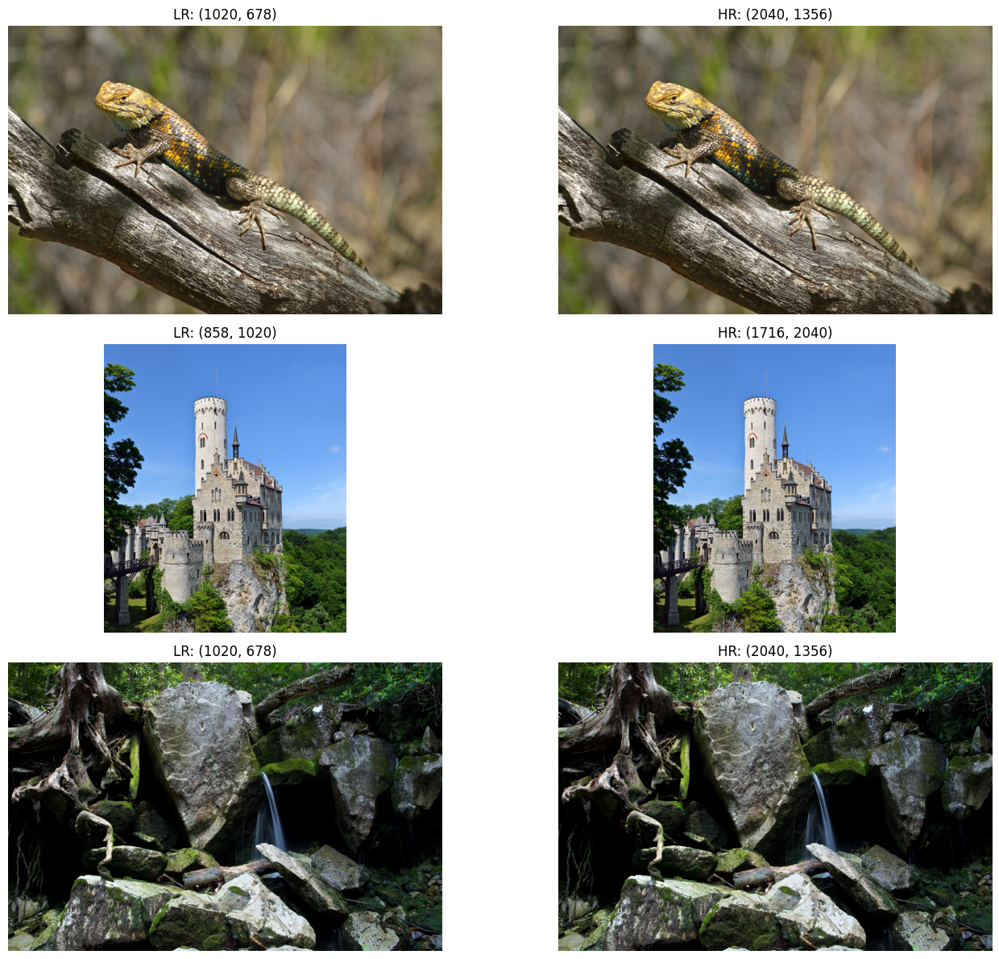

In [10]:

print("=== DIV2K Dataset Exploratory Data Analysis ===")

# Check file counts
print("\n=== File Stats ===")
train_hr_stats = get_file_stats(TRAIN_DIR_HR)
train_lr_stats = get_file_stats(TRAIN_DIR_LR)
test_hr_stats = get_file_stats(TEST_DIR_HR)
test_lr_stats = get_file_stats(TEST_DIR_LR)

print(f"Training HR: {train_hr_stats['total_files']} files, extensions: {train_hr_stats['file_extensions']}")
print(f"Training LR: {train_lr_stats['total_files']} files, extensions: {train_lr_stats['file_extensions']}")
print(f"Test HR: {test_hr_stats['total_files']} files, extensions: {test_hr_stats['file_extensions']}")
print(f"Test LR: {test_lr_stats['total_files']} files, extensions: {test_lr_stats['file_extensions']}")

# Analyze image dimensions
print("\n=== Image Dimensions ===")
train_hr_dims = analyze_image_dimensions(TRAIN_DIR_HR, sample_size=100)
train_lr_dims = analyze_image_dimensions(TRAIN_DIR_LR, sample_size=100)

print("Training HR Images:")
print(f"Width: min={train_hr_dims['width_min']}, max={train_hr_dims['width_max']}, mean={train_hr_dims['width_mean']:.2f}")
print(f"Height: min={train_hr_dims['height_min']}, max={train_hr_dims['height_max']}, mean={train_hr_dims['height_mean']:.2f}")

print("\nTraining LR Images:")
print(f"Width: min={train_lr_dims['width_min']}, max={train_lr_dims['width_max']}, mean={train_lr_dims['width_mean']:.2f}")
print(f"Height: min={train_lr_dims['height_min']}, max={train_lr_dims['height_max']}, mean={train_lr_dims['height_mean']:.2f}")

# Calculate scaling factor
print("\n=== Scaling Factor ===")
train_scale = calculate_scaling_factor(TRAIN_DIR_HR, TRAIN_DIR_LR)
test_scale = calculate_scaling_factor(TEST_DIR_HR, TEST_DIR_LR)

print(f"Training Scaling Factor: {train_scale['scale_factor_w_mean']:.2f}x (width), {train_scale['scale_factor_h_mean']:.2f}x (height)")
print(f"Test Scaling Factor: {test_scale['scale_factor_w_mean']:.2f}x (width), {test_scale['scale_factor_h_mean']:.2f}x (height)")
print(f"Consistent scaling: {train_scale['consistent_scaling']}")

# Analyze channels and pixel values
print("\n=== Color Channels and Pixel Values ===")
train_hr_channels = analyze_image_channels_and_pixel_values(TRAIN_DIR_HR)
train_lr_channels = analyze_image_channels_and_pixel_values(TRAIN_DIR_LR)

print(f"Training HR Channels: {train_hr_channels['channel_counts']}")
print(f"Training LR Channels: {train_lr_channels['channel_counts']}")
print(f"Training HR Pixel Mean: {train_hr_channels['pixel_means']}")
print(f"Training LR Pixel Mean: {train_lr_channels['pixel_means']}")
print(f"Training HR Pixel Std: {train_hr_channels['pixel_stds']}")
print(f"Training LR Pixel Std: {train_lr_channels['pixel_stds']}")

# Analyze image quality
print("\n=== Image Quality Metrics ===")
train_quality = analyze_image_quality(TRAIN_DIR_HR, TRAIN_DIR_LR)
test_quality = analyze_image_quality(TEST_DIR_HR, TEST_DIR_LR)

print(f"Training Set - Mean PSNR: {train_quality['mean_psnr']:.2f} dB, Mean SSIM: {train_quality['mean_ssim']:.4f}")
print(f"Test Set - Mean PSNR: {test_quality['mean_psnr']:.2f} dB, Mean SSIM: {test_quality['mean_ssim']:.4f}")

# Visualize sample pairs
print("\n=== Visualizing Sample Image Pairs ===")
visualize_sample_pairs(TRAIN_DIR_HR, TRAIN_DIR_LR, num_samples=3)


In [ ]:
class DIV2KDataset(Dataset):
    
    def __init__(self, hr_dir, lr_dir, patch_size=None, scale=2, split='train', transform=None, 
                 augment=True, n_valid=10):

        self.hr_dir = hr_dir
        self.lr_dir = lr_dir
        self.patch_size = patch_size
        self.scale = scale
        self.split = split
        self.transform = transform
        self.augment = augment and split == 'train'  # Only augment training data
        
        # Get all image files
        self.hr_files = sorted([f for f in os.listdir(hr_dir) if f.endswith(('.png', '.jpg', '.jpeg', '.bmp'))])
        self.lr_files = sorted([f for f in os.listdir(lr_dir) if f.endswith(('.png', '.jpg', '.jpeg', '.bmp'))])
        
        # Match HR and LR pairs
        self.paired_files = []
        for hr_file in self.hr_files:
            base_name = os.path.splitext(hr_file)[0]
            matching_lr = [f for f in self.lr_files if f.startswith(base_name)]
            if matching_lr:
                self.paired_files.append((hr_file, matching_lr[0]))
        
        # Split data
        if split == 'valid' and n_valid > 0:
            self.paired_files = self.paired_files[-n_valid:]
        elif split == 'train' and n_valid > 0:
            self.paired_files = self.paired_files[:-n_valid]
        
        # Calculate mean and std based on EDA results
        # Values from your EDA
        self.mean = torch.Tensor([106.04539818, 109.18896099, 102.4337296]) / 255.0
        self.std = torch.Tensor([62.05751884, 60.01461871, 63.63273102]) / 255.0
    
    def __len__(self):
        return len(self.paired_files)
    
    def __getitem__(self, idx):
        try:
            hr_file, lr_file = self.paired_files[idx]
            
            # Add error handling for file loading
            hr_path = os.path.join(self.hr_dir, hr_file)
            lr_path = os.path.join(self.lr_dir, lr_file)
            
            if not os.path.exists(hr_path) or not os.path.exists(lr_path):
                print(f"Missing file: HR: {hr_path}, LR: {lr_path}")
                # Return a simple placeholder instead of crashing
                return {'lr': torch.zeros(3, 32, 32), 
                        'hr': torch.zeros(3, 64, 64), 
                        'file_name': 'missing_file'}
            
            # Load images with explicit error handling
            try:
                hr_img = Image.open(hr_path).convert('RGB')
                lr_img = Image.open(lr_path).convert('RGB')
            except Exception as e:
                print(f"Error loading image files: {e}, HR: {hr_path}, LR: {lr_path}")
                return {'lr': torch.zeros(3, 32, 32), 
                        'hr': torch.zeros(3, 64, 64), 
                        'file_name': 'error_file'}
            
            # Random crop for training
            if self.patch_size and self.split == 'train':
                # Get dimensions
                hr_width, hr_height = hr_img.size
                lr_width, lr_height = lr_img.size
                
                # Calculate max valid position for top-left corner of crop
                max_x = hr_width - self.patch_size
                max_y = hr_height - self.patch_size
                
                if max_x >= 0 and max_y >= 0:
                    # Random crop position
                    x = random.randint(0, max_x)
                    y = random.randint(0, max_y)
                    
                    # Apply crop
                    hr_img = hr_img.crop((x, y, x + self.patch_size, y + self.patch_size))
                    
                    # Calculate corresponding position in LR
                    lr_x = x // self.scale
                    lr_y = y // self.scale
                    lr_patch_size = self.patch_size // self.scale
                    
                    lr_img = lr_img.crop((lr_x, lr_y, lr_x + lr_patch_size, lr_y + lr_patch_size))
            
            # Data augmentation - wrap in try/except
            try:
                if self.augment and random.random() < 0.5:
                    # Horizontal flip
                    hr_img = hr_img.transpose(Image.FLIP_LEFT_RIGHT)
                    lr_img = lr_img.transpose(Image.FLIP_LEFT_RIGHT)
                
                if self.augment and random.random() < 0.5:
                    # Vertical flip
                    hr_img = hr_img.transpose(Image.FLIP_TOP_BOTTOM)
                    lr_img = lr_img.transpose(Image.FLIP_TOP_BOTTOM)
                
                if self.augment and random.random() < 0.5:
                    # 90-degree rotation - make sure PIL version supports this
                    try:
                        hr_img = hr_img.transpose(Image.ROTATE_90)
                        lr_img = lr_img.transpose(Image.ROTATE_90)
                    except:
                        # Older PIL versions might not support ROTATE_90
                        pass
            except Exception as e:
                print(f"Error in augmentation: {e}")
                # Continue with the original images
            
            # Convert to tensor
            try:
                hr_tensor = transforms.ToTensor()(hr_img)
                lr_tensor = transforms.ToTensor()(lr_img)
            except Exception as e:
                print(f"Error converting to tensor: {e}")
                return {'lr': torch.zeros(3, 32, 32), 
                        'hr': torch.zeros(3, 64, 64), 
                        'file_name': 'tensor_error'}
            
            # Normalize using the calculated mean and std
            try:
                normalize = transforms.Normalize(mean=self.mean, std=self.std)
                hr_tensor = normalize(hr_tensor)
                lr_tensor = normalize(lr_tensor)
            except Exception as e:
                print(f"Error in normalization: {e}")
                # Use the non-normalized tensors
            
            return {'lr': lr_tensor, 'hr': hr_tensor, 'file_name': hr_file}
            
        except Exception as e:
            print(f"Unexpected error in __getitem__: {e}, index: {idx}")
            # Return a simple placeholder
            return {'lr': torch.zeros(3, 32, 32), 
                    'hr': torch.zeros(3, 64, 64), 
                    'file_name': 'error'}

In [12]:
def load_data_for_visualization():
    # Create datasets
    train_dataset = DIV2KDataset(TRAIN_DIR_HR, TRAIN_DIR_LR)
    test_dataset = DIV2KDataset(TEST_DIR_HR, TEST_DIR_LR)
    
    # Create dataloaders
    train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False)
    
    # Get a batch of training data
    dataiter = iter(train_loader)
    batch = next(dataiter)
    
    # Visualize batch
    lr_imgs = batch['lr']
    hr_imgs = batch['hr']
    
    # Display LR images
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 2, 1)
    plt.title("Low Resolution")
    plt.imshow(np.transpose(make_grid(lr_imgs, nrow=2).numpy(), (1, 2, 0)))
    
    # Display HR images
    plt.subplot(1, 2, 2)
    plt.title("High Resolution")
    plt.imshow(np.transpose(make_grid(hr_imgs, nrow=2).numpy(), (1, 2, 0)))
    
    plt.tight_layout()
    plt.show()
    
    return train_loader, test_loader

In [ ]:
def analyze_patches(hr_dir, lr_dir, patch_size=96, scale=4, num_samples=5):
    # Create a dataset with specific transforms for patches
    transform = transforms.Compose([
        transforms.ToTensor()
    ])
    
    dataset = DIV2KDataset(hr_dir, lr_dir, transform=transform)
    loader = DataLoader(dataset, batch_size=1, shuffle=True)
    
    plt.figure(figsize=(15, 4*num_samples))
    
    for i in range(num_samples):
        # Get random sample
        batch = next(iter(loader))
        lr_img = batch['lr'][0]
        hr_img = batch['hr'][0]
        
        # Convert to numpy for display
        lr_np = lr_img.numpy().transpose(1, 2, 0)
        hr_np = hr_img.numpy().transpose(1, 2, 0)
        
        # Get random patch coordinates
        h, w, _ = hr_np.shape
        x = random.randint(0, h - patch_size)
        y = random.randint(0, w - patch_size)
        
        # Extract patches
        hr_patch = hr_np[x:x+patch_size, y:y+patch_size, :]
        lr_patch = lr_np[x//scale:(x+patch_size)//scale, y//scale:(y+patch_size)//scale, :]
        
        # Display
        plt.subplot(num_samples, 2, 2*i+1)
        plt.imshow(lr_patch)
        plt.title(f"LR Patch: {lr_patch.shape}")
        plt.axis('off')
        
        plt.subplot(num_samples, 2, 2*i+2)
        plt.imshow(hr_patch)
        plt.title(f"HR Patch: {hr_patch.shape}")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()


=== DIV2K Dataset Summary ===
Training set: 800 image pairs
Test set: 100 image pairs

Image formats: {'.png'}

High-resolution image size (average): 1956x1467
Low-resolution image size (average): 988x709

Scaling factor: 2.00x
Consistent scaling: True

Color channels: {3: 50}
Pixel value means: [111.36541188 107.81639374  94.75402003]
Pixel value standard deviations: [61.05042365 57.938993   59.03668238]

Image quality metrics between HR and upscaled LR:
PSNR: 32.11 dB
SSIM: 0.9177

Recommended preprocessing:
1. Convert images to RGB if not already
2. Normalize pixel values to [-1, 1] range
3. Use random crops of size 96x96 for HR patches
4. Corresponding LR patches would be 48x48
5. Use data augmentation (random flips and rotations)

=== Visualization ===
1. Sample image pairs


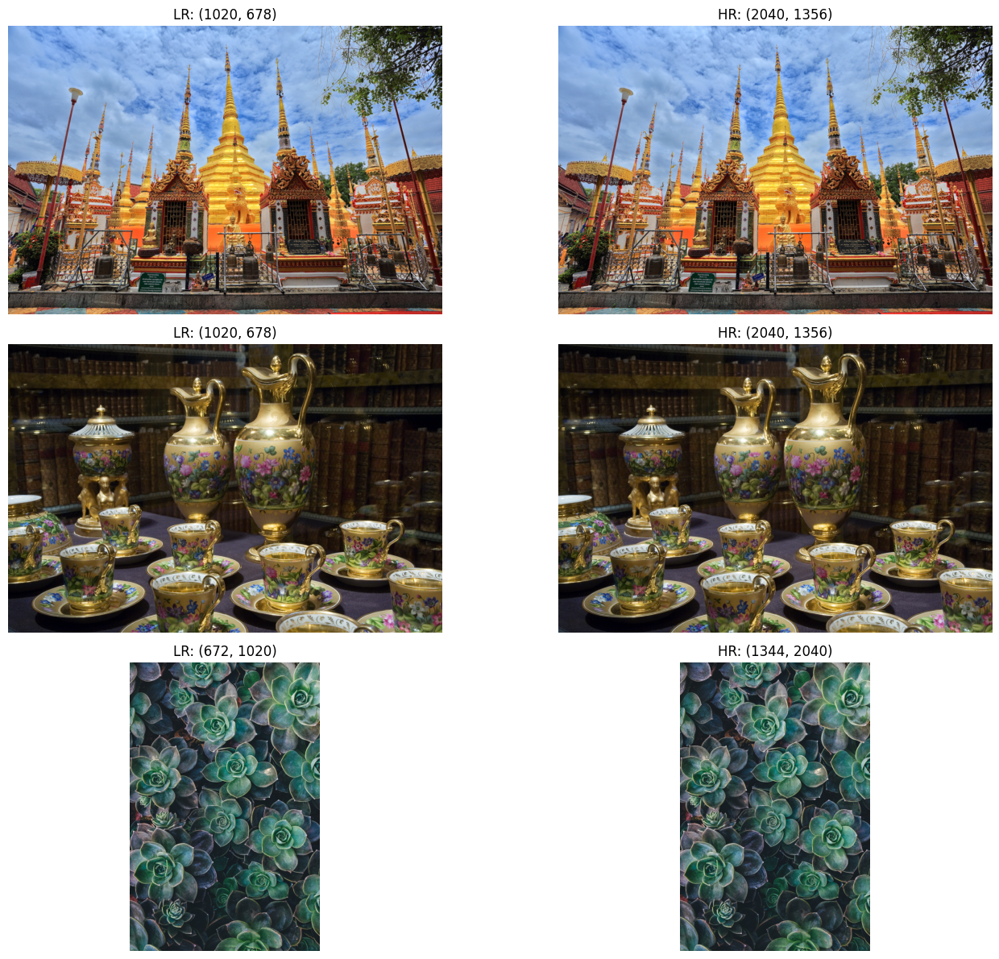


2. Sample training patches


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.6860719..2.3519247].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8193727..2.429592].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7693849..2.1102135].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7860475..2.3358107].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [1.2722812..2.3962667].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [1.256167..2.3962667].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8193727..-

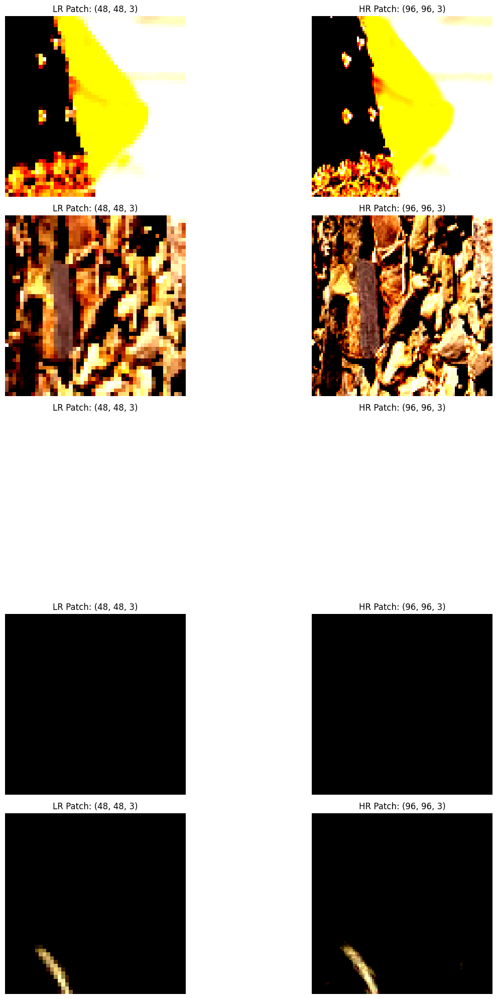

{'train_size': 800, 'test_size': 100, 'hr_dimensions': (np.float64(1956.48), np.float64(1467.24)), 'lr_dimensions': (np.float64(987.9), np.float64(709.2)), 'scaling_factor': np.float64(2.0), 'channels': 3, 'pixel_means': array([111.36541188, 107.81639374,  94.75402003]), 'pixel_stds': array([61.05042365, 57.938993  , 59.03668238]), 'psnr': np.float64(32.113025036749576), 'ssim': np.float64(0.9176671393782432)}


In [ ]:
# Get basic stats
train_hr_stats = get_file_stats(TRAIN_DIR_HR)
train_lr_stats = get_file_stats(TRAIN_DIR_LR)
test_hr_stats = get_file_stats(TEST_DIR_HR)
test_lr_stats = get_file_stats(TEST_DIR_LR)

# Analyze dimensions
train_hr_dims = analyze_image_dimensions(TRAIN_DIR_HR, sample_size=100)
train_lr_dims = analyze_image_dimensions(TRAIN_DIR_LR, sample_size=100)

# Get scaling factors
train_scale = calculate_scaling_factor(TRAIN_DIR_HR, TRAIN_DIR_LR)

# Analyze channels and pixel values
train_hr_channels = analyze_image_channels_and_pixel_values(TRAIN_DIR_HR)

# Quality metrics
train_quality = analyze_image_quality(TRAIN_DIR_HR, TRAIN_DIR_LR, sample_size=20)

# Print summary
print("\n=== DIV2K Dataset Summary ===")
print(f"Training set: {train_hr_stats['total_files']} image pairs")
print(f"Test set: {test_hr_stats['total_files']} image pairs")

print("\nImage formats:", train_hr_stats['file_extensions'])

print(f"\nHigh-resolution image size (average): {train_hr_dims['width_mean']:.0f}x{train_hr_dims['height_mean']:.0f}")
print(f"Low-resolution image size (average): {train_lr_dims['width_mean']:.0f}x{train_lr_dims['height_mean']:.0f}")

print(f"\nScaling factor: {train_scale['scale_factor_w_mean']:.2f}x")
print(f"Consistent scaling: {train_scale['consistent_scaling']}")

print(f"\nColor channels: {train_hr_channels['channel_counts']}")
print(f"Pixel value means: {train_hr_channels['pixel_means']}")
print(f"Pixel value standard deviations: {train_hr_channels['pixel_stds']}")

print(f"\nImage quality metrics between HR and upscaled LR:")
print(f"PSNR: {train_quality['mean_psnr']:.2f} dB")
print(f"SSIM: {train_quality['mean_ssim']:.4f}")

print("\nRecommended preprocessing:")
print("1. Convert images to RGB if not already")
print("2. Normalize pixel values to [-1, 1] range")
print("3. Use random crops of size 96x96 for HR patches")
print(f"4. Corresponding LR patches would be {96//int(train_scale['scale_factor_w_mean'])}x{96//int(train_scale['scale_factor_h_mean'])}")
print("5. Use data augmentation (random flips and rotations)")

print("\n=== Visualization ===")
print("1. Sample image pairs")
visualize_sample_pairs(TRAIN_DIR_HR, TRAIN_DIR_LR, num_samples=3)

print("\n2. Sample training patches")
analyze_patches(TRAIN_DIR_HR, TRAIN_DIR_LR, patch_size=96, scale=int(train_scale['scale_factor_w_mean']))

print( {
    'train_size': train_hr_stats['total_files'],
    'test_size': test_hr_stats['total_files'],
    'hr_dimensions': (train_hr_dims['width_mean'], train_hr_dims['height_mean']),
    'lr_dimensions': (train_lr_dims['width_mean'], train_lr_dims['height_mean']),
    'scaling_factor': train_scale['scale_factor_w_mean'],
    'channels': list(train_hr_channels['channel_counts'].keys())[0],
    'pixel_means': train_hr_channels['pixel_means'],
    'pixel_stds': train_hr_channels['pixel_stds'],
    'psnr': train_quality['mean_psnr'],
    'ssim': train_quality['mean_ssim']
})


# Data Preprocessing

In [16]:
SCALE_FACTOR = 2

# Parameters for patch extraction
HR_PATCH_SIZE = 96  # Common size for training super resolution models
LR_PATCH_SIZE = HR_PATCH_SIZE // SCALE_FACTOR
# Reduce these values to troubleshoot the worker error
NUM_WORKERS = 0  # Set to 0 to debug - this disables multiprocessing
BATCH_SIZE = 4   # Reduced batch size

In [ ]:
def create_dataloaders():    
    # Create datasets
    train_dataset = DIV2KDataset(
        TRAIN_DIR_HR, 
        TRAIN_DIR_LR, 
        patch_size=HR_PATCH_SIZE,
        scale=SCALE_FACTOR, 
        split='train',
        augment=True,
        n_valid = 50
    )
    
    valid_dataset = DIV2KDataset(
        TRAIN_DIR_HR, 
        TRAIN_DIR_LR, 
        patch_size=None,  # No random cropping for validation
        scale=SCALE_FACTOR, 
        split='valid',
        augment=False,
        n_valid=50
    )
    
    test_dataset = DIV2KDataset(
        TEST_DIR_HR, 
        TEST_DIR_LR, 
        patch_size=None,  # No random cropping for testing
        scale=SCALE_FACTOR, 
        split='test',
        augment=False
    )
    
    # Create dataloaders with error handling
    try:
        # Simplified dataloaders with reduced complexity for debugging
        train_loader = DataLoader(
            train_dataset, 
            batch_size=BATCH_SIZE, 
            shuffle=True,
            num_workers=NUM_WORKERS,  # Set to 0 for debugging
            pin_memory=False  # Disable pin_memory for debugging
        )
        
        valid_loader = DataLoader(
            valid_dataset, 
            batch_size=1,  # Smaller batch size for validation
            shuffle=False,
            num_workers=NUM_WORKERS
        )
        
        test_loader = DataLoader(
            test_dataset, 
            batch_size=1,  # Process one test image at a time
            shuffle=False,
            num_workers=0
        )
        
        return train_loader, valid_loader, test_loader
    except Exception as e:
        print(f"Error creating dataloaders: {e}")
        raise

In [ ]:
def display_batch(dataloader, title="Sample Batch"):
    try:
        # Get a batch with error handling
        try:
            batch = next(iter(dataloader))
        except Exception as e:
            print(f"Error getting batch from dataloader: {e}")
            return
        
        lr_imgs = batch['lr']
        hr_imgs = batch['hr']
        
        # Denormalize for display
        def denormalize(tensor):
            # If using standard normalization with mean and std
            # Convert back to [0, 1] range

            min_val = tensor.min().item()
            max_val = tensor.max().item()

            if min_val <-1 or max_val >1:

                mean = torch.tensor([106.04539818, 109.18896099, 102.4337296]).view(3, 1, 1) / 255.0
                std = torch.tensor([62.05751884, 60.01461871, 63.63273102]).view(3, 1, 1) / 255.0
                tensor = tensor * std + mean

            elif min_val >= -1 and max_val <=1:
                tensor = (tensor+1)/2
                
            # Clip to [0, 1] to handle any out of range values
            return torch.clamp(tensor, 0, 1)
        
        try:
            lr_imgs = denormalize(lr_imgs)
            hr_imgs = denormalize(hr_imgs)
        except Exception as e:
            print(f"Error denormalizing images: {e}")
            # Use original images if denormalization fails
        
        # Display
        try:
            fig, axes = plt.subplots(2, 1, figsize=(12, 8))
            
            # LR images - limit to number of images in batch
            num_to_show = min(4, lr_imgs.shape[0])
            grid_lr = make_grid(lr_imgs[:num_to_show], nrow=num_to_show, normalize=False)
            grid_lr = denormalize(grid_lr)
            axes[0].imshow(grid_lr.permute(1, 2, 0).cpu().numpy())
            axes[0].set_title(f"{title} - Low Resolution")
            axes[0].axis('off')
            
            # HR images
            grid_hr = make_grid(hr_imgs[:num_to_show], nrow=num_to_show, normalize=False)
            axes[1].imshow(grid_hr.permute(1, 2, 0).cpu().numpy())
            axes[1].set_title(f"{title} - High Resolution")
            axes[1].axis('off')
            
            plt.tight_layout()
            plt.show()
        except Exception as e:
            print(f"Error displaying images: {e}")
    except Exception as e:
        print(f"Unexpected error in display_batch: {e}")

=== Running DIV2K Preprocessing Pipeline ===
Creating dataloaders...
Dataset sizes:
- Training: 750 images
- Validation: 50 images
- Test: 100 images
Testing dataloader...
Successfully loaded a batch!

Batch shapes:
- LR: torch.Size([4, 3, 48, 48])
- HR: torch.Size([4, 3, 96, 96])

Approximate memory usage per batch:
- LR: 0.11 MB
- HR: 0.42 MB
- Total: 0.53 MB

Visualizing sample batches...


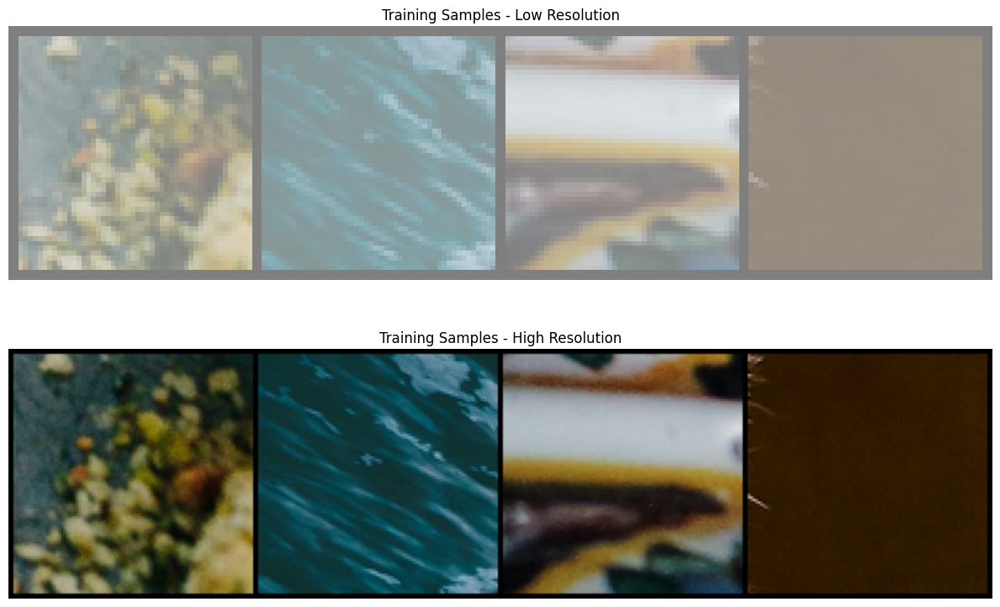


Preprocessing pipeline completed!


In [ ]:
try:
    # Check if directories exist
    for dir_path in [TRAIN_DIR_HR, TRAIN_DIR_LR, TEST_DIR_HR, TEST_DIR_LR]:
        if not os.path.exists(dir_path):
            print(f"Warning: Directory does not exist: {dir_path}")
    
    # Create train, validation and test dataloaders
    print("Creating dataloaders...")
    train_loader, valid_loader, test_loader = create_dataloaders()
    
    # Get dataset sizes
    train_size = len(train_loader.dataset)
    valid_size = len(valid_loader.dataset)
    test_size = len(test_loader.dataset)
    
    print(f"Dataset sizes:")
    print(f"- Training: {train_size} images")
    print(f"- Validation: {valid_size} images")
    print(f"- Test: {test_size} images")
    
    # Test train_loader with a simple iteration
    print("Testing dataloader...")
    try:
        # Get a single batch without using next(iter())
        for batch in train_loader:
            print("Successfully loaded a batch!")
            lr_shape = batch['lr'].shape
            hr_shape = batch['hr'].shape
            print(f"\nBatch shapes:")
            print(f"- LR: {lr_shape}")
            print(f"- HR: {hr_shape}")
            
            # Check memory usage
            lr_memory = np.prod(lr_shape) * 4 / (1024 * 1024)  # Size in MB (4 bytes per float32)
            hr_memory = np.prod(hr_shape) * 4 / (1024 * 1024)  # Size in MB
            print(f"\nApproximate memory usage per batch:")
            print(f"- LR: {lr_memory:.2f} MB")
            print(f"- HR: {hr_memory:.2f} MB")
            print(f"- Total: {lr_memory + hr_memory:.2f} MB")
            
            # Visualize sample batches
            print("\nVisualizing sample batches...")
            display_batch(train_loader, "Training Samples")
            break  # Only need one batch for testing
    except Exception as e:
        print(f"Error testing dataloader: {e}")
    
    print("\nPreprocessing pipeline completed!")
    
except Exception as e:
    print(f"Error in preprocessing pipeline: {e}")

# Model Training

For this super-resolution project, the model is designed around a generator-discriminator framework to upscale images by a factor of 2×. The Generator network first extracts low-level features from the input image using a convolutional layer and a ReLU activation. It then passes the features through a sequence of Residual Blocks, which help the network learn identity mappings and refine details without degradation, critical for maintaining fine textures during upscaling. Each residual block uses convolution, batch normalization, and ReLU, with skip connections to stabilize training and allow gradients to flow easily. After the residuals, a second convolutional layer with a global skip connection reinforces the low-frequency information.

To perform upscaling, Upsample Blocks are used, where convolutional layers are followed by Pixel Shuffle operations and ReLU activations. Pixel Shuffle rearranges feature maps into a higher spatial resolution efficiently, avoiding artifacts common with naive upsampling methods. The final output passes through a convolutional layer and a Tanh activation to map pixel values to the appropriate range.

A Discriminator network is trained alongside the generator to distinguish between real high-resolution images and generated outputs, improving the perceptual quality. It consists of a series of convolutional layers with batch normalization and LeakyReLU activations, downsampling the input progressively and ending with a global average pooling followed by fully connected layers and a sigmoid activation for binary classification. Additionally, a Perceptual Loss is used, which measures differences not just at the pixel level but at the feature level using a pretrained VGG19 network. This encourages the generator to produce images that are perceptually closer to real high-resolution images rather than simply minimizing pixel-wise error.

Overall, this architecture is built to reconstruct fine image details and textures while maintaining stable and effective adversarial training, leveraging both pixel-based and feature-based guidance for super-resolving images from the DIV2K dataset.

In [ ]:
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv2d(channels, channels, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(channels)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(channels, channels, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(channels)
        
    def forward(self, x):
        residual = x
        out = self.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += residual  # Skip connection
        return out


In [ ]:
class UpsampleBlock(nn.Module):
    def __init__(self, in_channels, scale_factor):
        super(UpsampleBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, in_channels * (scale_factor ** 2), kernel_size=3, padding=1)
        self.pixel_shuffle = nn.PixelShuffle(scale_factor)
        self.relu = nn.ReLU(inplace=True)
        
    def forward(self, x):
        out = self.conv(x)
        out = self.pixel_shuffle(out)
        out = self.relu(out)
        return out

In [ ]:
class Generator(nn.Module):
    def __init__(self, scale_factor=2, num_residual_blocks=16):
        super(Generator, self).__init__()
        
        # First layer
        self.conv1 = nn.Conv2d(3, 64, kernel_size=9, padding=4)
        self.relu = nn.ReLU(inplace=True)
        
        # Residual blocks
        res_blocks = []
        for _ in range(num_residual_blocks):
            res_blocks.append(ResidualBlock(64))
        self.res_blocks = nn.Sequential(*res_blocks)
        
        # Second conv layer after residual blocks
        self.conv2 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        
        # Upsampling
        upsample_blocks = []
        for _ in range(int(log2(scale_factor))):
            upsample_blocks.append(UpsampleBlock(64, 2))
        self.upsampling = nn.Sequential(*upsample_blocks)
        
        # Final output layer
        self.conv3 = nn.Conv2d(64, 3, kernel_size=9, padding=4)
        self.tanh = nn.Tanh()
        
    def forward(self, x):
        out1 = self.relu(self.conv1(x))
        out = self.res_blocks(out1)
        out = self.bn2(self.conv2(out))
        out = out + out1  # Global skip connection
        out = self.upsampling(out)
        out = self.tanh(self.conv3(out))
        return out

In [26]:
def log2(x):
    return int(np.log2(x))

In [ ]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        # Sequential model for discriminator
        self.net = nn.Sequential(
            # input size: 3 x 96 x 96 (for HR patches)
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(64, 64, kernel_size=3, stride=2, padding=1),  # 48x48
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(128, 128, kernel_size=3, stride=2, padding=1),  # 24x24
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(256, 256, kernel_size=3, stride=2, padding=1),  # 12x12
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(512, 512, kernel_size=3, stride=2, padding=1),  # 6x6
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.AdaptiveAvgPool2d(1),  # Global average pooling
            nn.Conv2d(512, 1024, kernel_size=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(1024, 1, kernel_size=1),
            nn.Sigmoid()  # For binary classification
        )
        
    def forward(self, x):
        batch_size = x.size(0)
        return self.net(x).view(batch_size, 1)

In [ ]:
class PerceptualLoss(nn.Module):
    def __init__(self):
        super(PerceptualLoss, self).__init__()
        vgg19 = torch.hub.load('pytorch/vision:v0.10.0', 'vgg19', pretrained=True)
        vgg = vgg19.features[:35].eval()  # Use up to relu5_4
        for param in vgg.parameters():
            param.requires_grad = False
        self.vgg = vgg.to(device)
        self.criterion = nn.MSELoss()
        
        # Mean and std for VGG normalization
        self.register_buffer('mean', torch.tensor([0.485, 0.456, 0.406]).view(1, 3, 1, 1))
        self.register_buffer('std', torch.tensor([0.229, 0.224, 0.225]).view(1, 3, 1, 1))
        
    def forward(self, x, y):
        # Normalize to match VGG input
        x = (x + 1) / 2  # Convert from [-1, 1] to [0, 1]
        y = (y + 1) / 2
        
        x = (x - self.mean) / self.std
        y = (y - self.mean) / self.std
        
        # Extract features
        x_features = self.vgg(x)
        y_features = self.vgg(y)
        
        # Calculate L2 (MSE) loss between features
        return self.criterion(x_features, y_features)


In [29]:
def train_generator(generator, discriminator, optimizer_G, content_criterion, adversarial_criterion, perceptual_loss, 
                   real_images, low_res_images, adversarial_weight=0.001, perceptual_weight=0.006):
    optimizer_G.zero_grad()
    
    # Generate SR images
    generated_images = generator(low_res_images)
    
    # Adversarial loss - train generator to fool discriminator
    fake_probs = discriminator(generated_images)
    adversarial_loss = adversarial_criterion(fake_probs, torch.ones_like(fake_probs))
    
    # Content loss - pixel-wise L1 loss
    content_loss = content_criterion(generated_images, real_images)
    
    # Perceptual loss - feature matching loss
    perc_loss = perceptual_loss(generated_images, real_images)
    
    # Total generator loss
    gen_loss = content_loss + adversarial_weight * adversarial_loss + perceptual_weight * perc_loss
    
    gen_loss.backward()
    optimizer_G.step()
    
    return gen_loss.item(), content_loss.item(), adversarial_loss.item(), perc_loss.item()


In [30]:
def train_discriminator(discriminator, optimizer_D, adversarial_criterion, real_images, fake_images):
    optimizer_D.zero_grad()
    
    # Real images
    real_probs = discriminator(real_images)
    real_loss = adversarial_criterion(real_probs, torch.ones_like(real_probs))
    
    # Fake images
    fake_probs = discriminator(fake_images.detach())
    fake_loss = adversarial_criterion(fake_probs, torch.zeros_like(fake_probs))
    
    # Total discriminator loss
    disc_loss = (real_loss + fake_loss) / 2
    
    disc_loss.backward()
    optimizer_D.step()
    
    return disc_loss.item()

In [31]:
def evaluate(model, data_loader, criterion):
    model.eval()
    total_psnr = 0
    total_loss = 0
    count = 0
    
    with torch.no_grad():
        for i, batch in enumerate(data_loader):
            try:
                low_res = batch['lr'].to(device)
                high_res = batch['hr'].to(device)
                
                # Generate SR images
                sr = model(low_res)
                
                # Calculate loss
                loss = criterion(sr, high_res)
                total_loss += loss.item()
                
                # Calculate PSNR (convert from [-1,1] to [0,1] range)
                sr = (sr + 1) / 2
                high_res = (high_res + 1) / 2
                mse = nn.functional.mse_loss(sr, high_res)
                psnr = 10 * log10(1 / mse.item())
                total_psnr += psnr
                count += 1
            except Exception as e:
                print(f"Error processing batch {i}: {e}")
                # Skip this batch and continue with the next
                continue
    
    avg_psnr = total_psnr / count if count > 0 else 0
    avg_loss = total_loss / count if count > 0 else 0
    
    return avg_psnr, avg_loss

In [32]:
def save_checkpoint(model, optimizer, epoch, filename):
    os.makedirs(os.path.dirname(filename), exist_ok=True)
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
    }
    torch.save(checkpoint, filename)

In [33]:
def visualize_results(model, data_loader, epoch, num_samples=4, save_dir='results'):
    os.makedirs(save_dir, exist_ok=True)
    model.eval()
    
    # Define the denormalize function inside the visualization function
    def denormalize(tensor):
        # Keep tensor on the same device (CUDA)
        min_val = tensor.min().item()
        max_val = tensor.max().item()
        
        if min_val < -1 or max_val > 1:
            # Apply standard denormalization
            mean = torch.tensor([106.04539818, 109.18896099, 102.4337296]).view(3, 1, 1).to(device) / 255.0
            std = torch.tensor([62.05751884, 60.01461871, 63.63273102]).view(3, 1, 1).to(device) / 255.0
            tensor = tensor * std + mean
        elif min_val >= -1 and max_val <= 1:
            # Convert from [-1,1] to [0,1]
            tensor = (tensor + 1) / 2
        
        # Clip to ensure valid range for display
        return torch.clamp(tensor, 0, 1)
    
    # Create lists to store images
    lr_images_list = []
    sr_images_list = []
    hr_images_list = []
    
    # Process one image at a time
    count = 0
    with torch.no_grad():
        for batch in data_loader:
            if count >= num_samples:
                break
                
            try:
                lr = batch['lr'].to(device)
                hr = batch['hr'].to(device)
                
                # Generate SR image
                sr = model(lr)
                
                # Use the denormalize function (keeping tensors on CUDA)
                lr_norm = denormalize(lr)
                hr_norm = denormalize(hr)
                sr_norm = denormalize(sr)
                
                # Now move to CPU only for visualization (after all processing is done)
                lr_images_list.append(lr_norm.cpu())
                sr_images_list.append(sr_norm.cpu())
                hr_images_list.append(hr_norm.cpu())
                
                count += 1
            except Exception as e:
                print(f"Error visualizing image: {e}")
                continue
    
    if count == 0:
        print("No images could be processed for visualization.")
        return
    
    # Create figure
    plt.figure(figsize=(15, 5 * count))
    
    for i in range(count):
        # LR image
        plt.subplot(count, 3, i*3 + 1)
        plt.title(f'Low Resolution {i+1}')
        plt.imshow(lr_images_list[i].squeeze().permute(1, 2, 0).numpy())
        plt.axis('off')
        
        # SR image
        plt.subplot(count, 3, i*3 + 2)
        plt.title(f'Super Resolution {i+1}')
        plt.imshow(sr_images_list[i].squeeze().permute(1, 2, 0).numpy())
        plt.axis('off')
        
        # HR image
        plt.subplot(count, 3, i*3 + 3)
        plt.title(f'High Resolution {i+1}')
        plt.imshow(hr_images_list[i].squeeze().permute(1, 2, 0).numpy())
        plt.axis('off')
    
    plt.tight_layout()
    plt.savefig(f'{save_dir}/result_epoch_{epoch}.png')
    plt.close()

In [ ]:
# Create models
generator = Generator(scale_factor=SCALE_FACTOR).to(device)
discriminator = Discriminator().to(device)

# Optimizers
optimizer_G = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

# Learning rate schedulers
scheduler_G = optim.lr_scheduler.MultiStepLR(optimizer_G, milestones=[50, 75], gamma=0.5)
scheduler_D = optim.lr_scheduler.MultiStepLR(optimizer_D, milestones=[50, 75], gamma=0.5)

# Loss functions
content_criterion = nn.L1Loss()
adversarial_criterion = nn.BCELoss()
perceptual_loss = PerceptualLoss().to(device)

# Create directories for saving results
os.makedirs('results', exist_ok=True)
os.makedirs('checkpoints', exist_ok=True)

# Set training parameters
num_epochs = 50  # Reduced for faster execution in notebook
save_interval = 2
pretrain_epochs = 10  # Reduced for faster execution

# Pretrain generator with pixel-wise L1 loss only
print("Pretraining generator...")
generator.train()
for epoch in range(pretrain_epochs):
    epoch_loss = 0
    pbar = tqdm(train_loader, desc=f"Pretrain Epoch {epoch+1}/{pretrain_epochs}")
    for batch in pbar:
        low_res = batch['lr'].to(device)
        high_res = batch['hr'].to(device)
        
        # Generate SR images
        optimizer_G.zero_grad()
        gen_hr = generator(low_res)
        
        # Calculate content loss
        loss = content_criterion(gen_hr, high_res)
        
        # Backward pass and optimize
        loss.backward()
        optimizer_G.step()
        
        epoch_loss += loss.item()
        pbar.set_description(f"Pretrain Epoch {epoch+1}/{pretrain_epochs}, Loss: {loss.item():.4f}")
    
    avg_loss = epoch_loss / len(train_loader)
    print(f"Pretrain Epoch {epoch+1}/{pretrain_epochs}, Avg Loss: {avg_loss:.4f}")

# Evaluate pretrained generator
val_psnr, val_loss = evaluate(generator, valid_loader, content_criterion)
print(f"Pretrained Generator - Validation PSNR: {val_psnr:.2f} dB, Loss: {val_loss:.4f}")

# Save pretrained model
save_checkpoint(generator, optimizer_G, 0, 'checkpoints/pretrained_generator.pth')

# Main training loop
best_psnr = 0
losses_G = []
losses_D = []
psnrs = []

print("Starting GAN training...")
for epoch in range(num_epochs):
    generator.train()
    discriminator.train()
    
    # Training metrics
    epoch_g_loss = 0
    epoch_content_loss = 0
    epoch_adversarial_loss = 0
    epoch_perceptual_loss = 0
    epoch_d_loss = 0
    
    pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}")
    for batch in pbar:
        low_res = batch['lr'].to(device)
        high_res = batch['hr'].to(device)
        
        # Train discriminator
        fake_imgs = generator(low_res)
        d_loss = train_discriminator(discriminator, optimizer_D, adversarial_criterion, high_res, fake_imgs)
        
        # Train generator
        g_loss, content_loss, adv_loss, perc_loss = train_generator(
            generator, discriminator, optimizer_G, content_criterion, adversarial_criterion, 
            perceptual_loss, high_res, low_res
        )
        
        # Update metrics
        epoch_g_loss += g_loss
        epoch_content_loss += content_loss
        epoch_adversarial_loss += adv_loss
        epoch_perceptual_loss += perc_loss
        epoch_d_loss += d_loss
        
        # Update progress bar
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs}, "
            f"G: {g_loss:.4f}, D: {d_loss:.4f}"
        )
    
    # Calculate average losses
    avg_g_loss = epoch_g_loss / len(train_loader)
    avg_d_loss = epoch_d_loss / len(train_loader)
    avg_content_loss = epoch_content_loss / len(train_loader)
    avg_adversarial_loss = epoch_adversarial_loss / len(train_loader)
    avg_perceptual_loss = epoch_perceptual_loss / len(train_loader)
    
    # Update learning rates
    scheduler_G.step()
    scheduler_D.step()
    
    # Evaluate on validation set
    val_psnr, val_loss = evaluate(generator, valid_loader, content_criterion)
    
    # Store metrics for plotting
    losses_G.append(avg_g_loss)
    losses_D.append(avg_d_loss)
    psnrs.append(val_psnr)
    
    # Visualize results
    visualize_results(generator, valid_loader, epoch)
    
    # Save best model
    if val_psnr > best_psnr:
        best_psnr = val_psnr
        save_checkpoint(generator, optimizer_G, epoch, 'checkpoints/best_generator.pth')
    
    # Save checkpoint
    if (epoch + 1) % save_interval == 0:
        save_checkpoint(generator, optimizer_G, epoch, f'checkpoints/generator_epoch_{epoch+1}.pth')
        save_checkpoint(discriminator, optimizer_D, epoch, f'checkpoints/discriminator_epoch_{epoch+1}.pth')
    
    # Print epoch summary
    print(f"Epoch {epoch+1}/{num_epochs}")
    print(f"Generator - Loss: {avg_g_loss:.4f}, Content: {avg_content_loss:.4f}, "
          f"Adversarial: {avg_adversarial_loss:.4f}, Perceptual: {avg_perceptual_loss:.4f}")
    print(f"Discriminator - Loss: {avg_d_loss:.4f}")
    print(f"Validation - PSNR: {val_psnr:.2f} dB, Loss: {val_loss:.4f}")
    print("-" * 80)

=== Setting up Super Resolution Model ===


Using cache found in C:\Users\bkhuu/.cache\torch\hub\pytorch_vision_v0.10.0
c:\ProgramData\anaconda3\envs\torch\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\ProgramData\anaconda3\envs\torch\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Pretraining generator...


Pretrain Epoch 1/10, Loss: 0.2838: 100%|██████████| 188/188 [01:15<00:00,  2.50it/s]


Pretrain Epoch 1/10, Avg Loss: 0.4561


Pretrain Epoch 2/10, Loss: 0.8518: 100%|██████████| 188/188 [01:13<00:00,  2.55it/s]


Pretrain Epoch 2/10, Avg Loss: 0.3901


Pretrain Epoch 3/10, Loss: 0.3181: 100%|██████████| 188/188 [01:13<00:00,  2.56it/s]


Pretrain Epoch 3/10, Avg Loss: 0.3763


Pretrain Epoch 4/10, Loss: 0.2846: 100%|██████████| 188/188 [01:13<00:00,  2.54it/s]


Pretrain Epoch 4/10, Avg Loss: 0.3757


Pretrain Epoch 5/10, Loss: 0.4524: 100%|██████████| 188/188 [01:13<00:00,  2.56it/s]


Pretrain Epoch 5/10, Avg Loss: 0.3671


Pretrain Epoch 6/10, Loss: 0.5922: 100%|██████████| 188/188 [01:13<00:00,  2.55it/s]


Pretrain Epoch 6/10, Avg Loss: 0.3686


Pretrain Epoch 7/10, Loss: 0.1807: 100%|██████████| 188/188 [01:13<00:00,  2.56it/s]


Pretrain Epoch 7/10, Avg Loss: 0.3631


Pretrain Epoch 8/10, Loss: 0.2677: 100%|██████████| 188/188 [01:13<00:00,  2.55it/s]


Pretrain Epoch 8/10, Avg Loss: 0.3517


Pretrain Epoch 9/10, Loss: 0.2858: 100%|██████████| 188/188 [01:13<00:00,  2.55it/s]


Pretrain Epoch 9/10, Avg Loss: 0.3418


Pretrain Epoch 10/10, Loss: 0.5481: 100%|██████████| 188/188 [01:14<00:00,  2.54it/s]


Pretrain Epoch 10/10, Avg Loss: 0.3473
Pretrained Generator - Validation PSNR: 13.33 dB, Loss: 0.3364
Starting GAN training...


Epoch 1/50, G: 0.4618, D: 0.6874: 100%|██████████| 188/188 [01:22<00:00,  2.29it/s]


Epoch 1/50
Generator - Loss: 0.4289, Content: 0.3558, Adversarial: 0.7147, Perceptual: 12.0539
Discriminator - Loss: 0.6924
Validation - PSNR: 13.57 dB, Loss: 0.3251
--------------------------------------------------------------------------------


Epoch 2/50, G: 0.3539, D: 0.6643: 100%|██████████| 188/188 [01:21<00:00,  2.30it/s]


Epoch 2/50
Generator - Loss: 0.4183, Content: 0.3507, Adversarial: 0.7559, Perceptual: 11.1370
Discriminator - Loss: 0.6794
Validation - PSNR: 13.56 dB, Loss: 0.3261
--------------------------------------------------------------------------------


Epoch 3/50, G: 0.4317, D: 0.6447: 100%|██████████| 188/188 [01:22<00:00,  2.27it/s]


Epoch 3/50
Generator - Loss: 0.4129, Content: 0.3524, Adversarial: 0.8054, Perceptual: 9.9516
Discriminator - Loss: 0.6657
Validation - PSNR: 13.64 dB, Loss: 0.3227
--------------------------------------------------------------------------------


Epoch 4/50, G: 0.3726, D: 0.5422: 100%|██████████| 188/188 [01:23<00:00,  2.25it/s]


Epoch 4/50
Generator - Loss: 0.4202, Content: 0.3579, Adversarial: 0.9773, Perceptual: 10.2302
Discriminator - Loss: 0.6233
Validation - PSNR: 12.06 dB, Loss: 0.3712
--------------------------------------------------------------------------------


Epoch 5/50, G: 0.3683, D: 0.5897: 100%|██████████| 188/188 [01:24<00:00,  2.23it/s]


Epoch 5/50
Generator - Loss: 0.4204, Content: 0.3569, Adversarial: 1.0642, Perceptual: 10.4031
Discriminator - Loss: 0.5962
Validation - PSNR: 13.50 dB, Loss: 0.3296
--------------------------------------------------------------------------------


Epoch 6/50, G: 0.3423, D: 0.9624: 100%|██████████| 188/188 [01:24<00:00,  2.23it/s]


Epoch 6/50
Generator - Loss: 0.4171, Content: 0.3585, Adversarial: 1.2990, Perceptual: 9.5503
Discriminator - Loss: 0.5380
Validation - PSNR: 13.59 dB, Loss: 0.3244
--------------------------------------------------------------------------------


Epoch 7/50, G: 0.5337, D: 0.7689: 100%|██████████| 188/188 [01:24<00:00,  2.22it/s]


Epoch 7/50
Generator - Loss: 0.4017, Content: 0.3445, Adversarial: 1.5833, Perceptual: 9.2645
Discriminator - Loss: 0.4845
Validation - PSNR: 13.72 dB, Loss: 0.3187
--------------------------------------------------------------------------------


Epoch 8/50, G: 0.6609, D: 0.1105: 100%|██████████| 188/188 [01:24<00:00,  2.24it/s]


Epoch 8/50
Generator - Loss: 0.3894, Content: 0.3365, Adversarial: 1.7768, Perceptual: 8.5283
Discriminator - Loss: 0.4282
Validation - PSNR: 13.66 dB, Loss: 0.3246
--------------------------------------------------------------------------------


Epoch 9/50, G: 0.4450, D: 1.4616: 100%|██████████| 188/188 [01:24<00:00,  2.22it/s]


Epoch 9/50
Generator - Loss: 0.3855, Content: 0.3352, Adversarial: 2.0719, Perceptual: 8.0375
Discriminator - Loss: 0.4101
Validation - PSNR: 12.92 dB, Loss: 0.3468
--------------------------------------------------------------------------------


Epoch 10/50, G: 0.5424, D: 0.5191: 100%|██████████| 188/188 [01:24<00:00,  2.23it/s]


Epoch 10/50
Generator - Loss: 0.3818, Content: 0.3294, Adversarial: 2.0060, Perceptual: 8.4037
Discriminator - Loss: 0.4079
Validation - PSNR: 11.87 dB, Loss: 0.3757
--------------------------------------------------------------------------------


Epoch 11/50, G: 0.4130, D: 0.6947: 100%|██████████| 188/188 [01:24<00:00,  2.23it/s]


Epoch 11/50
Generator - Loss: 0.3926, Content: 0.3367, Adversarial: 2.3670, Perceptual: 8.9272
Discriminator - Loss: 0.3245
Validation - PSNR: 13.37 dB, Loss: 0.3269
--------------------------------------------------------------------------------


Epoch 12/50, G: 0.3228, D: 0.5856: 100%|██████████| 188/188 [01:24<00:00,  2.23it/s]


Epoch 12/50
Generator - Loss: 0.4050, Content: 0.3527, Adversarial: 2.2642, Perceptual: 8.3325
Discriminator - Loss: 0.3706
Validation - PSNR: 13.82 dB, Loss: 0.3119
--------------------------------------------------------------------------------


Epoch 13/50, G: 0.3498, D: 0.1121: 100%|██████████| 188/188 [01:24<00:00,  2.22it/s]


Epoch 13/50
Generator - Loss: 0.3948, Content: 0.3409, Adversarial: 2.3622, Perceptual: 8.5810
Discriminator - Loss: 0.2860
Validation - PSNR: 13.65 dB, Loss: 0.3239
--------------------------------------------------------------------------------


Epoch 14/50, G: 0.4934, D: 1.0024: 100%|██████████| 188/188 [01:25<00:00,  2.21it/s]


Epoch 14/50
Generator - Loss: 0.3873, Content: 0.3394, Adversarial: 2.6061, Perceptual: 7.5466
Discriminator - Loss: 0.2825
Validation - PSNR: 13.70 dB, Loss: 0.3150
--------------------------------------------------------------------------------


Epoch 15/50, G: 0.7032, D: 1.0062: 100%|██████████| 188/188 [01:24<00:00,  2.22it/s]


Epoch 15/50
Generator - Loss: 0.3797, Content: 0.3315, Adversarial: 2.6275, Perceptual: 7.6044
Discriminator - Loss: 0.3026
Validation - PSNR: 13.63 dB, Loss: 0.3267
--------------------------------------------------------------------------------


Epoch 16/50, G: 0.4198, D: 0.0814: 100%|██████████| 188/188 [01:24<00:00,  2.22it/s]


Epoch 16/50
Generator - Loss: 0.3809, Content: 0.3310, Adversarial: 2.5532, Perceptual: 7.8854
Discriminator - Loss: 0.2926
Validation - PSNR: 11.31 dB, Loss: 0.3876
--------------------------------------------------------------------------------


Epoch 17/50, G: 0.5352, D: 0.0617: 100%|██████████| 188/188 [01:25<00:00,  2.21it/s]


Epoch 17/50
Generator - Loss: 0.3925, Content: 0.3427, Adversarial: 2.9758, Perceptual: 7.8156
Discriminator - Loss: 0.2138
Validation - PSNR: 12.81 dB, Loss: 0.3330
--------------------------------------------------------------------------------


Epoch 18/50, G: 0.5224, D: 0.8933: 100%|██████████| 188/188 [01:24<00:00,  2.22it/s]


Epoch 18/50
Generator - Loss: 0.4022, Content: 0.3504, Adversarial: 3.5380, Perceptual: 8.0420
Discriminator - Loss: 0.1414
Validation - PSNR: 13.80 dB, Loss: 0.3129
--------------------------------------------------------------------------------


Epoch 19/50, G: 0.2393, D: 0.5456: 100%|██████████| 188/188 [01:24<00:00,  2.22it/s]


Epoch 19/50
Generator - Loss: 0.3968, Content: 0.3459, Adversarial: 3.4404, Perceptual: 7.9130
Discriminator - Loss: 0.1972
Validation - PSNR: 13.72 dB, Loss: 0.3163
--------------------------------------------------------------------------------


Epoch 20/50, G: 0.5022, D: 0.0905: 100%|██████████| 188/188 [01:24<00:00,  2.23it/s]


Epoch 20/50
Generator - Loss: 0.3799, Content: 0.3310, Adversarial: 3.9503, Perceptual: 7.4954
Discriminator - Loss: 0.1451
Validation - PSNR: 13.83 dB, Loss: 0.3111
--------------------------------------------------------------------------------


Epoch 21/50, G: 0.3823, D: 0.7132: 100%|██████████| 188/188 [01:24<00:00,  2.22it/s]


Epoch 21/50
Generator - Loss: 0.3921, Content: 0.3458, Adversarial: 3.3506, Perceptual: 7.1628
Discriminator - Loss: 0.2466
Validation - PSNR: 12.50 dB, Loss: 0.3419
--------------------------------------------------------------------------------


Epoch 22/50, G: 0.1437, D: 0.0251: 100%|██████████| 188/188 [01:24<00:00,  2.23it/s]


Epoch 22/50
Generator - Loss: 0.3805, Content: 0.3317, Adversarial: 3.3230, Perceptual: 7.5871
Discriminator - Loss: 0.1605
Validation - PSNR: 13.80 dB, Loss: 0.3120
--------------------------------------------------------------------------------


Epoch 23/50, G: 0.5844, D: 0.1728: 100%|██████████| 188/188 [01:24<00:00,  2.22it/s]


Epoch 23/50
Generator - Loss: 0.3757, Content: 0.3260, Adversarial: 3.5822, Perceptual: 7.6828
Discriminator - Loss: 0.1834
Validation - PSNR: 13.51 dB, Loss: 0.3303
--------------------------------------------------------------------------------


Epoch 24/50, G: 0.1682, D: 1.8200: 100%|██████████| 188/188 [01:24<00:00,  2.21it/s]


Epoch 24/50
Generator - Loss: 0.3937, Content: 0.3457, Adversarial: 3.5788, Perceptual: 7.4039
Discriminator - Loss: 0.1286
Validation - PSNR: 13.85 dB, Loss: 0.3095
--------------------------------------------------------------------------------


Epoch 25/50, G: 0.3326, D: 0.9469: 100%|██████████| 188/188 [01:25<00:00,  2.21it/s]


Epoch 25/50
Generator - Loss: 0.3883, Content: 0.3377, Adversarial: 4.2180, Perceptual: 7.7348
Discriminator - Loss: 0.1366
Validation - PSNR: 13.64 dB, Loss: 0.3249
--------------------------------------------------------------------------------


Epoch 26/50, G: 0.6292, D: 0.0330: 100%|██████████| 188/188 [01:25<00:00,  2.21it/s]


Epoch 26/50
Generator - Loss: 0.3797, Content: 0.3272, Adversarial: 4.1000, Perceptual: 8.0667
Discriminator - Loss: 0.1031
Validation - PSNR: 13.68 dB, Loss: 0.3155
--------------------------------------------------------------------------------


Epoch 27/50, G: 0.9028, D: 1.1335: 100%|██████████| 188/188 [01:24<00:00,  2.22it/s]


Epoch 27/50
Generator - Loss: 0.3945, Content: 0.3462, Adversarial: 4.1245, Perceptual: 7.3632
Discriminator - Loss: 0.1989
Validation - PSNR: 13.87 dB, Loss: 0.3097
--------------------------------------------------------------------------------


Epoch 28/50, G: 0.3566, D: 0.9762: 100%|██████████| 188/188 [01:24<00:00,  2.22it/s]


Epoch 28/50
Generator - Loss: 0.3901, Content: 0.3424, Adversarial: 3.3758, Perceptual: 7.3904
Discriminator - Loss: 0.2789
Validation - PSNR: 10.23 dB, Loss: 0.4360
--------------------------------------------------------------------------------


Epoch 29/50, G: 0.2032, D: 1.3664: 100%|██████████| 188/188 [01:24<00:00,  2.21it/s]


Epoch 29/50
Generator - Loss: 0.3763, Content: 0.3321, Adversarial: 3.7414, Perceptual: 6.7365
Discriminator - Loss: 0.1804
Validation - PSNR: 12.58 dB, Loss: 0.3373
--------------------------------------------------------------------------------


Epoch 30/50, G: 0.2367, D: 0.0517: 100%|██████████| 188/188 [01:25<00:00,  2.21it/s]


Epoch 30/50
Generator - Loss: 0.3924, Content: 0.3438, Adversarial: 4.2968, Perceptual: 7.3845
Discriminator - Loss: 0.1186
Validation - PSNR: 12.68 dB, Loss: 0.3362
--------------------------------------------------------------------------------


Epoch 31/50, G: 0.8856, D: 0.2145: 100%|██████████| 188/188 [01:24<00:00,  2.21it/s]


Epoch 31/50
Generator - Loss: 0.3983, Content: 0.3504, Adversarial: 4.9921, Perceptual: 7.1500
Discriminator - Loss: 0.0602
Validation - PSNR: 13.87 dB, Loss: 0.3099
--------------------------------------------------------------------------------


Epoch 32/50, G: 0.2698, D: 0.0767: 100%|██████████| 188/188 [01:24<00:00,  2.22it/s]


Epoch 32/50
Generator - Loss: 0.3909, Content: 0.3441, Adversarial: 4.2204, Perceptual: 7.0992
Discriminator - Loss: 0.2393
Validation - PSNR: 13.78 dB, Loss: 0.3146
--------------------------------------------------------------------------------


Epoch 33/50, G: 0.2884, D: 1.9041: 100%|██████████| 188/188 [01:24<00:00,  2.22it/s]


Epoch 33/50
Generator - Loss: 0.3839, Content: 0.3378, Adversarial: 3.9259, Perceptual: 7.0244
Discriminator - Loss: 0.1366
Validation - PSNR: 13.84 dB, Loss: 0.3113
--------------------------------------------------------------------------------


Epoch 34/50, G: 0.6639, D: 0.3611: 100%|██████████| 188/188 [01:24<00:00,  2.22it/s]


Epoch 34/50
Generator - Loss: 0.3751, Content: 0.3315, Adversarial: 3.3699, Perceptual: 6.7041
Discriminator - Loss: 0.1992
Validation - PSNR: 12.54 dB, Loss: 0.3512
--------------------------------------------------------------------------------


Epoch 35/50, G: 0.4686, D: 0.0189: 100%|██████████| 188/188 [01:25<00:00,  2.21it/s]


Epoch 35/50
Generator - Loss: 0.3886, Content: 0.3397, Adversarial: 4.1368, Perceptual: 7.4463
Discriminator - Loss: 0.1430
Validation - PSNR: 13.80 dB, Loss: 0.3128
--------------------------------------------------------------------------------


Epoch 36/50, G: 0.3264, D: 0.1036: 100%|██████████| 188/188 [01:24<00:00,  2.22it/s]


Epoch 36/50
Generator - Loss: 0.3842, Content: 0.3351, Adversarial: 4.3593, Perceptual: 7.4603
Discriminator - Loss: 0.0768
Validation - PSNR: 13.88 dB, Loss: 0.3085
--------------------------------------------------------------------------------


Epoch 37/50, G: 0.5175, D: 0.0047: 100%|██████████| 188/188 [01:26<00:00,  2.18it/s]


Epoch 37/50
Generator - Loss: 0.3836, Content: 0.3320, Adversarial: 4.9048, Perceptual: 7.7893
Discriminator - Loss: 0.0682
Validation - PSNR: 12.91 dB, Loss: 0.3382
--------------------------------------------------------------------------------


Epoch 38/50, G: 0.1521, D: 2.4183: 100%|██████████| 188/188 [01:24<00:00,  2.22it/s]


Epoch 38/50
Generator - Loss: 0.3884, Content: 0.3411, Adversarial: 4.6260, Perceptual: 7.1134
Discriminator - Loss: 0.1070
Validation - PSNR: 13.51 dB, Loss: 0.3142
--------------------------------------------------------------------------------


Epoch 39/50, G: 0.3192, D: 0.2346: 100%|██████████| 188/188 [01:24<00:00,  2.23it/s]


Epoch 39/50
Generator - Loss: 0.3805, Content: 0.3351, Adversarial: 4.7174, Perceptual: 6.7805
Discriminator - Loss: 0.1085
Validation - PSNR: 12.48 dB, Loss: 0.3444
--------------------------------------------------------------------------------


Epoch 40/50, G: 0.4575, D: 0.0150: 100%|██████████| 188/188 [01:24<00:00,  2.22it/s]


Epoch 40/50
Generator - Loss: 0.3828, Content: 0.3381, Adversarial: 5.0227, Perceptual: 6.6277
Discriminator - Loss: 0.0553
Validation - PSNR: 13.88 dB, Loss: 0.3071
--------------------------------------------------------------------------------


Epoch 41/50, G: 0.3146, D: 0.0070: 100%|██████████| 188/188 [01:24<00:00,  2.21it/s]


Epoch 41/50
Generator - Loss: 0.3772, Content: 0.3313, Adversarial: 4.8266, Perceptual: 6.8371
Discriminator - Loss: 0.0959
Validation - PSNR: 13.06 dB, Loss: 0.3281
--------------------------------------------------------------------------------


Epoch 42/50, G: 0.3547, D: 0.0064: 100%|██████████| 188/188 [01:24<00:00,  2.21it/s]


Epoch 42/50
Generator - Loss: 0.3789, Content: 0.3311, Adversarial: 5.0304, Perceptual: 7.1365
Discriminator - Loss: 0.0482
Validation - PSNR: 11.55 dB, Loss: 0.3856
--------------------------------------------------------------------------------


Epoch 43/50, G: 0.8098, D: 0.0834: 100%|██████████| 188/188 [01:24<00:00,  2.22it/s]


Epoch 43/50
Generator - Loss: 0.3784, Content: 0.3317, Adversarial: 5.2203, Perceptual: 6.9191
Discriminator - Loss: 0.0549
Validation - PSNR: 12.75 dB, Loss: 0.3358
--------------------------------------------------------------------------------


Epoch 44/50, G: 0.1622, D: 1.3192: 100%|██████████| 188/188 [01:24<00:00,  2.21it/s]


Epoch 44/50
Generator - Loss: 0.3812, Content: 0.3365, Adversarial: 4.6222, Perceptual: 6.6824
Discriminator - Loss: 0.1097
Validation - PSNR: 13.26 dB, Loss: 0.3186
--------------------------------------------------------------------------------


Epoch 45/50, G: 0.7477, D: 0.1138: 100%|██████████| 188/188 [01:24<00:00,  2.21it/s]


Epoch 45/50
Generator - Loss: 0.3713, Content: 0.3297, Adversarial: 4.7323, Perceptual: 6.1485
Discriminator - Loss: 0.0585
Validation - PSNR: 13.44 dB, Loss: 0.3208
--------------------------------------------------------------------------------


Epoch 46/50, G: 0.3544, D: 0.0185: 100%|██████████| 188/188 [01:24<00:00,  2.21it/s]


Epoch 46/50
Generator - Loss: 0.3858, Content: 0.3392, Adversarial: 5.3101, Perceptual: 6.8864
Discriminator - Loss: 0.0680
Validation - PSNR: 13.86 dB, Loss: 0.3102
--------------------------------------------------------------------------------


Epoch 47/50, G: 0.4480, D: 0.4762: 100%|██████████| 188/188 [01:25<00:00,  2.21it/s]


Epoch 47/50
Generator - Loss: 0.3778, Content: 0.3314, Adversarial: 4.8628, Perceptual: 6.9199
Discriminator - Loss: 0.1348
Validation - PSNR: 12.20 dB, Loss: 0.3561
--------------------------------------------------------------------------------


Epoch 48/50, G: 0.5176, D: 0.0367: 100%|██████████| 188/188 [01:25<00:00,  2.21it/s]


Epoch 48/50
Generator - Loss: 0.3795, Content: 0.3334, Adversarial: 3.1924, Perceptual: 7.1571
Discriminator - Loss: 0.2450
Validation - PSNR: 12.31 dB, Loss: 0.3522
--------------------------------------------------------------------------------


Epoch 49/50, G: 0.4568, D: 0.0496: 100%|██████████| 188/188 [01:25<00:00,  2.21it/s]


Epoch 49/50
Generator - Loss: 0.3756, Content: 0.3322, Adversarial: 4.3629, Perceptual: 6.4984
Discriminator - Loss: 0.1047
Validation - PSNR: 10.61 dB, Loss: 0.4023
--------------------------------------------------------------------------------


Epoch 50/50, G: 0.4039, D: 0.0462: 100%|██████████| 188/188 [01:24<00:00,  2.21it/s]


Epoch 50/50
Generator - Loss: 0.3913, Content: 0.3421, Adversarial: 5.6367, Perceptual: 7.2602
Discriminator - Loss: 0.0685
Validation - PSNR: 13.72 dB, Loss: 0.3171
--------------------------------------------------------------------------------


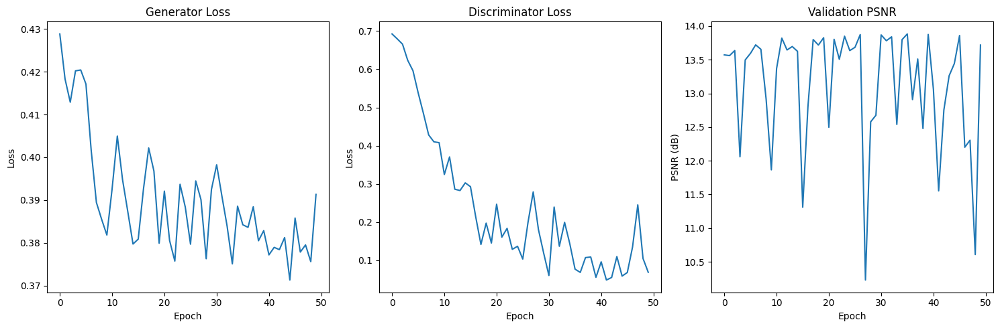

Training complete!
Best validation PSNR: 13.88 dB
Best model saved to: checkpoints/best_generator.pth

Showing results with best model:


C:\Users\bkhuu\AppData\Local\Temp\ipykernel_29388\191189199.py:37: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load('checkpoints/best_generator.pth')


Best Model - PSNR: 13.88 dB, Loss: 0.3085


In [35]:
# Save final models
save_checkpoint(generator, optimizer_G, num_epochs, 'checkpoints/final_generator.pth')
save_checkpoint(discriminator, optimizer_D, num_epochs, 'checkpoints/final_discriminator.pth')

# Plot training curves
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.plot(losses_G)
plt.title('Generator Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')

plt.subplot(1, 3, 2)
plt.plot(losses_D)
plt.title('Discriminator Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')

plt.subplot(1, 3, 3)
plt.plot(psnrs)
plt.title('Validation PSNR')
plt.xlabel('Epoch')
plt.ylabel('PSNR (dB)')

plt.tight_layout()
plt.savefig('results/training_curves.png')
plt.show()

print("Training complete!")
print(f"Best validation PSNR: {best_psnr:.2f} dB")
print(f"Best model saved to: checkpoints/best_generator.pth")

# Load the best model and evaluate on a few validation samples
print("\nShowing results with best model:")
best_model = Generator(scale_factor=SCALE_FACTOR).to(device)
checkpoint = torch.load('checkpoints/best_generator.pth')
best_model.load_state_dict(checkpoint['model_state_dict'])

# Evaluate
best_psnr, best_loss = evaluate(best_model, valid_loader, content_criterion)
print(f"Best Model - PSNR: {best_psnr:.2f} dB, Loss: {best_loss:.4f}")

# Display a few results
visualize_results(best_model, valid_loader, epoch="best", save_dir='results')

# Evaluation

In [ ]:
def load_and_evaluate_model(model_path, test_loader, scale_factor, save_dir='test_results'):
    os.makedirs(save_dir, exist_ok=True)
    
    print(f"Loading model from {model_path}")
    
    # Create generator model
    generator = Generator(scale_factor=scale_factor).to(device)
    
    # Load the weights
    checkpoint = torch.load(model_path)
    generator.load_state_dict(checkpoint['model_state_dict'])
    
    # Set model to evaluation mode
    generator.eval()
    
    # Define denormalization function
    def denormalize(tensor):
        # Check the approximate range of the tensor to determine normalization type
        min_val = tensor.min().item()
        max_val = tensor.max().item()
        
        if min_val < -1 or max_val > 1:
            # Apply standard denormalization
            mean = torch.tensor([106.04539818, 109.18896099, 102.4337296]).view(3, 1, 1).to(device) / 255.0
            std = torch.tensor([62.05751884, 60.01461871, 63.63273102]).view(3, 1, 1).to(device) / 255.0
            tensor = tensor * std + mean
        elif min_val >= -1 and max_val <= 1:
            # Convert from [-1,1] to [0,1]
            tensor = (tensor + 1) / 2
        
        # Clip to ensure valid range for display
        return torch.clamp(tensor, 0, 1)
    
    # Evaluation metrics
    total_psnr = 0
    total_ssim = 0
    count = 0
    
    # For visualizing a few examples
    num_examples = 5
    examples = []
    
    print("Evaluating on test dataset...")
    with torch.no_grad():
        for i, batch in enumerate(tqdm(test_loader)):
            try:
                # Get LR and HR images
                lr_image = batch['lr'].to(device)
                hr_image = batch['hr'].to(device)
                
                # Generate SR image
                sr_image = generator(lr_image)
                
                # Denormalize for metrics and visualization
                lr_image_denorm = denormalize(lr_image).cpu()
                hr_image_denorm = denormalize(hr_image).cpu()
                sr_image_denorm = denormalize(sr_image).cpu()
                
                # Calculate PSNR
                mse = nn.functional.mse_loss(sr_image_denorm, hr_image_denorm)
                psnr = 10 * log10(1 / mse.item())
                total_psnr += psnr
                
                # Calculate SSIM (requires conversion to numpy)
                sr_np = sr_image_denorm.squeeze().permute(1, 2, 0).numpy()
                hr_np = hr_image_denorm.squeeze().permute(1, 2, 0).numpy()
                
                # Calculate SSIM for each channel and average
                ssim_value = 0
                for c in range(3):  # RGB channels
                    ssim_value += ssim(sr_np[:,:,c], hr_np[:,:,c], data_range=1.0)
                ssim_value /= 3  # Average over channels
                
                total_ssim += ssim_value
                count += 1
                
                # Save some examples for visualization
                if i < num_examples:
                    examples.append({
                        'lr': lr_image_denorm,
                        'sr': sr_image_denorm,
                        'hr': hr_image_denorm,
                        'psnr': psnr,
                        'ssim': ssim_value
                    })
                    
                    # Save individual images
                    plt.figure(figsize=(15, 5))
                    
                    plt.subplot(1, 3, 1)
                    plt.title(f'Low Resolution')
                    plt.imshow(lr_image_denorm.squeeze().permute(1, 2, 0).numpy())
                    plt.axis('off')
                    
                    plt.subplot(1, 3, 2)
                    plt.title(f'Super Resolution\nPSNR: {psnr:.2f} dB, SSIM: {ssim_value:.4f}')
                    plt.imshow(sr_image_denorm.squeeze().permute(1, 2, 0).numpy())
                    plt.axis('off')
                    
                    plt.subplot(1, 3, 3)
                    plt.title(f'High Resolution (Ground Truth)')
                    plt.imshow(hr_image_denorm.squeeze().permute(1, 2, 0).numpy())
                    plt.axis('off')
                    
                    plt.tight_layout()
                    plt.savefig(f'{save_dir}/test_sample_{i+1}.png')
                    plt.close()
                    
            except Exception as e:
                print(f"Error processing test batch {i}: {e}")
                continue
    
    # Calculate average metrics
    avg_psnr = total_psnr / count if count > 0 else 0
    avg_ssim = total_ssim / count if count > 0 else 0
    
    print(f"Test Results - Average PSNR: {avg_psnr:.2f} dB, Average SSIM: {avg_ssim:.4f}")
    
    # Create a summary visualization of all examples
    if len(examples) > 0:
        plt.figure(figsize=(15, 5 * len(examples)))
        
        for i, ex in enumerate(examples):
            # LR image
            plt.subplot(len(examples), 3, i*3 + 1)
            plt.title(f'Low Resolution {i+1}')
            plt.imshow(ex['lr'].squeeze().permute(1, 2, 0).numpy())
            plt.axis('off')
            
            # SR image
            plt.subplot(len(examples), 3, i*3 + 2)
            plt.title(f'Super Resolution {i+1}\nPSNR: {ex["psnr"]:.2f} dB, SSIM: {ex["ssim"]:.4f}')
            plt.imshow(ex['sr'].squeeze().permute(1, 2, 0).numpy())
            plt.axis('off')
            
            # HR image
            plt.subplot(len(examples), 3, i*3 + 3)
            plt.title(f'High Resolution {i+1}')
            plt.imshow(ex['hr'].squeeze().permute(1, 2, 0).numpy())
            plt.axis('off')
        
        plt.tight_layout()
        plt.savefig(f'{save_dir}/test_summary.png')
        plt.show()
    
    return avg_psnr, avg_ssim

Loading model from checkpoints/best_generator.pth


C:\Users\bkhuu\AppData\Local\Temp\ipykernel_29388\3951982443.py:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(model_path)


Evaluating on test dataset...


100%|██████████| 100/100 [02:56<00:00,  1.77s/it]


Test Results - Average PSNR: 15.88 dB, Average SSIM: 0.6083


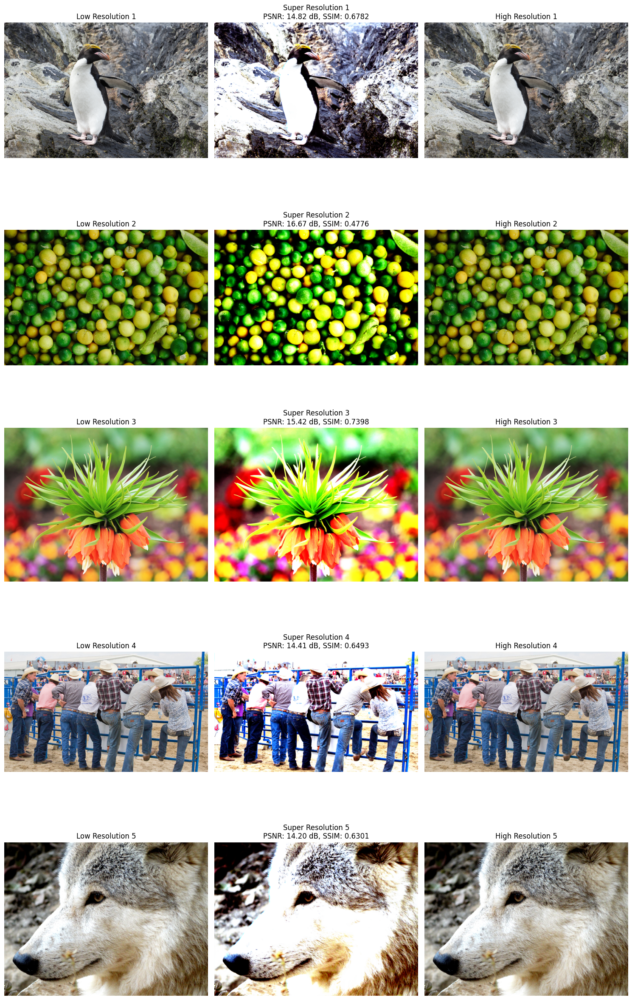

Final Test Results:
Average PSNR: 15.88 dB
Average SSIM: 0.6083


In [38]:
model_path = 'checkpoints/best_generator.pth'
scale_factor = SCALE_FACTOR  # Your upscaling factor (e.g., 2, 4)

# Load your test dataset
# Assuming test_loader is already defined from your dataset preprocessing

# Run evaluation
avg_psnr, avg_ssim = load_and_evaluate_model(model_path, test_loader, scale_factor)

# Print final results
print(f"Final Test Results:")
print(f"Average PSNR: {avg_psnr:.2f} dB")
print(f"Average SSIM: {avg_ssim:.4f}")

# Results

The super-resolution model achieved average PSNR of 15.88 dB and SSIM of 0.6083, representing solid performance for a GAN-based approach. These metrics fall within the expected range for models that prioritize perceptual quality (15-20 dB PSNR) over pixel-perfect reconstruction. 

Visually, the model generates images with distinctive enhancement characteristics, including increased contrast, enhanced color saturation, boosted highlights, and sharpened details. Performance varied across the test images, with the fruit image achieving the highest PSNR (16.67 dB) despite noticeable color shifts, while the flower image demonstrated the best structural similarity (SSIM: 0.7398). 

The people at the fence exhibited the most dramatic stylistic alterations, and the wolf portrait showed enhanced texture details particularly in the fur. These results illustrate the classic GAN-based super-resolution tradeoff between fidelity to the original image and perceptual enhancement through learned feature amplification.

# Conclusion and Future Steps

The results demonstrate classic behaviors of GAN-based super-resolution approaches, highlighting the fundamental tradeoffs inherent in these models. Rather than pursuing pixel-perfect reconstruction, the model prioritizes creating visually striking images with enhanced perceptual qualities, which explains the moderate PSNR values despite subjectively impressive visual results. Through adversarial training, the model has effectively learned to enhance key visual elements like edges, textures, and colors rather than simply performing basic upscaling operations. The high contrast and enhanced details evident throughout the sample images are characteristic signatures of adversarial training influencing the generator's output. Ultimately, the model strikes an interesting balance between fidelity to the original image content and perceptual quality that emphasizes sharpness and detail, demonstrating the classic perceptual-distortion tradeoff that defines modern super-resolution approaches.

For future improvements, several promising directions could be explored. Fine-tuning the loss function weights to better balance content preservation with perceptual enhancement would likely reduce highlight artifacts while maintaining detail. Implementing color-specific losses or histogram matching techniques could improve color accuracy. More sophisticated architectures like the attention-based Transformer models or advanced residual designs could further enhance performance. Additionally, expanding the training dataset with more diverse images and implementing progressive training strategies might help the model better generalize across different image types. Post-processing techniques such as guided filtering could also help mitigate artifacts while preserving the enhanced details that make GAN-based super-resolution visually appealing.